test change

https://drive.google.com/drive/folders/1nv196wA9nLOvSnGO-Pkmor9Fwg4Gv6rE?usp=drive_link

# Raspberry PhenoSet Project - Exploratory Data Analysis

## Introduction
This notebook contains the exploratory data analysis (EDA), preprocessing, and preparation for model development for the Raspberry PhenoSet dataset. The dataset contains annotated images for monitoring raspberry development stages in vertical farming environments.

The Raspberry PhenoSet dataset includes annotated images of raspberries at different phenological stages. These annotations include bounding boxes and class labels for each instance, allowing us to analyze the dataset and prepare it for model training.


In [ ]:
# ============================================
# Standard Library Imports
# ============================================
import os                      # For handling file paths and directories
import sys                     # For system-specific parameters and functions
import json                    # For parsing and processing JSON annotations
import random                  # For generating random numbers and shuffling sequences
from collections import Counter, defaultdict  # For counting occurrences and creating default dictionaries

# ============================================
# Third-Party Imports
# ============================================
import numpy as np             # For numerical operations on arrays
import pandas as pd            # For data manipulation and tabular data structures
import matplotlib.pyplot as plt  # For plotting and visualizing data
from matplotlib.patches import Rectangle  # For drawing bounding boxes on plots


In [ ]:
# Detect if running in Google Colab
IN_COLAB = "google.colab" in sys.modules

if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')
    base_dir = "/content/drive/MyDrive/AAI_530_Final_Project-/data/raw/"  # Colab path
else:
    base_dir = "../data/raw/"  # Local path

# Define dataset paths dynamically
splits = {
    "train": {
        "json": os.path.join(base_dir, "train.json"),
        "images": os.path.join(base_dir, "images/train/")
    },
    "val": {
        "json": os.path.join(base_dir, "val.json"),
        "images": os.path.join(base_dir, "images/val/")
    },
    "test": {
        "json": os.path.join(base_dir, "test.json"),
        "images": os.path.join(base_dir, "images/test/")
    }
}

# Print directory status
print(f"✅ Running in {'Google Colab' if IN_COLAB else 'Local Jupyter'}")
print(f"✅ Base Directory Set to: {base_dir}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Running in Google Colab
✅ Base Directory Set to: /content/drive/MyDrive/AAI_530_Final_Project-/data/raw/


## 🔍 Dataset Integrity Check: Comparing JSON Annotations with Available Images

Before performing exploratory data analysis (EDA), we first verify whether the dataset is **properly synchronized** between:
- The **JSON annotation files** (`train.json`, `val.json`, `test.json`).
- The **actual image files** in the dataset directory.

This section:
1. **Counts the number of images listed in the JSON files** vs. **the number of actual images** in the dataset directory.
2. **Detects any missing or extra image files** that could cause training issues.


In [ ]:
# Function to count image files in a directory
def count_images(image_folder):
    """Returns the number of image files in the specified directory."""
    return len([f for f in os.listdir(image_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])

# Check each dataset split
for split in ["train", "val", "test"]:
    json_file = splits[split]["json"]
    image_folder = splits[split]["images"]

    # Load annotations from JSON file
    with open(json_file, "r") as f:
        data = json.load(f)

    num_json_entries = len(data["images"])  # Number of images expected based on JSON
    num_actual_images = count_images(image_folder)  # Number of actual image files in the directory

    # Print a summary for each dataset split
    print(f"📂 {split.upper()} SET:")
    print(f"  - Expected Images (from JSON): {num_json_entries}")
    print(f"  - Actual Image Files Found: {num_actual_images}")
    print(f"  - Match: {'✅ Yes' if num_json_entries == num_actual_images else '❌ No, check for missing or extra files!'}\n")


📂 TRAIN SET:
  - Expected Images (from JSON): 1337
  - Actual Image Files Found: 1301
  - Match: ❌ No, check for missing or extra files!

📂 VAL SET:
  - Expected Images (from JSON): 287
  - Actual Image Files Found: 274
  - Match: ❌ No, check for missing or extra files!

📂 TEST SET:
  - Expected Images (from JSON): 278
  - Actual Image Files Found: 278
  - Match: ✅ Yes



## 🛠 Detect Missing and Extra Image Files

If any **mismatches** were found in the previous step, this section will:
- **List missing image files** that are referenced in the JSON but not found in the dataset.
- **List extra image files** that exist in the dataset folder but are not referenced in the JSON.

This helps us determine whether to remove JSON entries with missing images or ignore extra image files.


In [ ]:
for split in ["train", "val", "test"]:
    json_file = splits[split]["json"]
    image_folder = splits[split]["images"]

    # Load annotations from JSON
    with open(json_file, "r") as f:
        data = json.load(f)

    # Get file names from JSON and actual image directory
    json_filenames = {img["file_name"] for img in data["images"]}
    actual_filenames = {f for f in os.listdir(image_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))}

    # Identify missing and extra image files
    missing_files = json_filenames - actual_filenames
    extra_files = actual_filenames - json_filenames

    print(f"📂 {split.upper()} SET:")

    # Print missing files if any
    if missing_files:
        print(f"  ⚠️ Missing Files ({len(missing_files)}): {list(missing_files)[:5]} ...")
    else:
        print("  ✅ No missing files.")

    # Print extra files if any
    if extra_files:
        print(f"  ⚠️ Extra Files ({len(extra_files)}): {list(extra_files)[:5]} ...")
    else:
        print("  ✅ No extra files.")

    print("\n")


📂 TRAIN SET:
  ⚠️ Missing Files (10): ['G (9).jpg', 'G (3).jpg', 'B (453).jpg', 'B (454).jpg', 'G (5).jpg'] ...
  ⚠️ Extra Files (5): ['G (225).JPG', 'G (222).JPG', 'G (224).JPG', 'G (226).JPG', 'G (223).JPG'] ...


📂 VAL SET:
  ⚠️ Missing Files (5): ['G (13).jpg', 'G (15).jpg', 'G (19).jpg', 'G (17).jpg', 'G (21).jpg'] ...
  ⚠️ Extra Files (1): ['G (227).JPG'] ...


📂 TEST SET:
  ⚠️ Missing Files (1): ['G (34).jpg'] ...
  ⚠️ Extra Files (1): ['G (228).JPG'] ...




## 🧹 Cleaning Dataset: Removing Missing JSON Entries & Ignoring Extra Image Files

This final step **cleans the dataset** to ensure that:
- **JSON annotations only reference images that actually exist**.
- **Extra image files that are not in the JSON are ignored**.

A new cleaned version of each JSON file will be saved as:
- `train_cleaned.json`
- `val_cleaned.json`
- `test_cleaned.json`

These cleaned JSON files should be used for further analysis and model training.


In [ ]:
def clean_json(json_path, image_folder):
    """
    Cleans the JSON file by:
    - Removing entries for missing images.
    - Ignoring extra image files not listed in the JSON.
    - Saving a cleaned version of the JSON file.

    Parameters:
        json_path (str): Path to the JSON file (e.g., train.json).
        image_folder (str): Path to the folder containing images.
    """

    # Load JSON file
    with open(json_path, "r") as f:
        data = json.load(f)

    # Extract file names from JSON and actual directory
    json_filenames = {img["file_name"] for img in data["images"]}
    actual_filenames = {f for f in os.listdir(image_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))}

    # Identify missing and extra image files
    missing_files = json_filenames - actual_filenames
    extra_files = actual_filenames - json_filenames

    # Filter JSON to exclude missing files
    cleaned_images = [img for img in data["images"] if img["file_name"] in actual_filenames]
    cleaned_annotations = [ann for ann in data["annotations"] if any(img["id"] == ann["image_id"] for img in cleaned_images)]

    print(f"🧹 Cleaning {json_path}...")
    print(f"  ⚠️ Removing {len(missing_files)} missing file entries from JSON.")
    print(f"  ⚠️ Ignoring {len(extra_files)} extra image files.")

    # Save the cleaned JSON file
    cleaned_data = {"images": cleaned_images, "annotations": cleaned_annotations, "categories": data["categories"]}
    cleaned_json_path = json_path.replace(".json", "_cleaned.json")

    with open(cleaned_json_path, "w") as f:
        json.dump(cleaned_data, f, indent=4)

    print(f"✅ Cleaned JSON saved at: {cleaned_json_path}")

# Run cleaning for all dataset splits
for split in ["train", "val", "test"]:
    clean_json(splits[split]["json"], splits[split]["images"])


🧹 Cleaning /content/drive/MyDrive/AAI_530_Final_Project-/data/raw/train.json...
  ⚠️ Removing 10 missing file entries from JSON.
  ⚠️ Ignoring 5 extra image files.
✅ Cleaned JSON saved at: /content/drive/MyDrive/AAI_530_Final_Project-/data/raw/train_cleaned.json
🧹 Cleaning /content/drive/MyDrive/AAI_530_Final_Project-/data/raw/val.json...
  ⚠️ Removing 5 missing file entries from JSON.
  ⚠️ Ignoring 1 extra image files.
✅ Cleaned JSON saved at: /content/drive/MyDrive/AAI_530_Final_Project-/data/raw/val_cleaned.json
🧹 Cleaning /content/drive/MyDrive/AAI_530_Final_Project-/data/raw/test.json...
  ⚠️ Removing 1 missing file entries from JSON.
  ⚠️ Ignoring 1 extra image files.
✅ Cleaned JSON saved at: /content/drive/MyDrive/AAI_530_Final_Project-/data/raw/test_cleaned.json


In [ ]:
# ==========================
# Cell: Switch to CLEANED JSON Files
# ==========================

import os

# NOTE: Make sure 'base_dir' is already defined above,
#       e.g., base_dir = "/content/drive/MyDrive/AAI_530_Final_Project~/data/raw/"
#       or wherever your images and JSON files actually reside.

# After cleaning is complete, update dataset paths to point to the *_cleaned.json files
splits = {
    "train": {
        "json": os.path.join(base_dir, "train_cleaned.json"),
        "images": os.path.join(base_dir, "images/train/")
    },
    "val": {
        "json": os.path.join(base_dir, "val_cleaned.json"),
        "images": os.path.join(base_dir, "images/val/")
    },
    "test": {
        "json": os.path.join(base_dir, "test_cleaned.json"),
        "images": os.path.join(base_dir, "images/test/")
    }
}

print("\n✅ Switching to CLEANED JSON paths after cleaning step...")
for key, paths in splits.items():
    print(f"📂 {key.upper()} – JSON: {paths['json']}, Images: {paths['images']}")



✅ Switching to CLEANED JSON paths after cleaning step...
📂 TRAIN – JSON: /content/drive/MyDrive/AAI_530_Final_Project-/data/raw/train_cleaned.json, Images: /content/drive/MyDrive/AAI_530_Final_Project-/data/raw/images/train/
📂 VAL – JSON: /content/drive/MyDrive/AAI_530_Final_Project-/data/raw/val_cleaned.json, Images: /content/drive/MyDrive/AAI_530_Final_Project-/data/raw/images/val/
📂 TEST – JSON: /content/drive/MyDrive/AAI_530_Final_Project-/data/raw/test_cleaned.json, Images: /content/drive/MyDrive/AAI_530_Final_Project-/data/raw/images/test/


## Helper Functions
To streamline the workflow, this section defines modular helper functions for common operations such as:

- **Data Normalization**: Prepares bounding box dimensions and class labels for analysis and modeling.
- **Data Visualization**: Provides insights into distributions, class balances, and dataset anomalies.
- **Exploratory Analysis**: Automates repetitive EDA tasks, ensuring consistency and clarity.

These functions improve readability, maintainability, and collaboration within the project team.

### Function: Normalize Bounding Box Sizes
This function adjusts bounding box dimensions by dividing their values by the corresponding image's width and height.

- **Purpose**: Ensure bounding boxes are consistent across varying image sizes, preparing the data for visualization and modeling.
- **Inputs**:
  - `annotations`: JSON data with bounding box details.
  - `images`: Metadata for image dimensions.
- **Output**: A list of normalized bounding box sizes (width, height).


In [ ]:
# ==========================
# Cell: Normalize BBox Sizes from In-Memory Dictionary
# ==========================

def normalize_bbox_sizes_dict(data):
    """
    Normalizes bounding box sizes by the dimensions of their corresponding images.
    Expects an already-loaded COCO-style annotations dict with "images" and "annotations".

    Parameters:
        data (dict): COCO-style dict with keys "images" and "annotations".

    Returns:
        list of (width_ratio, height_ratio) for each bounding box in data["annotations"].
    """
    import numpy as np

    # Create a dictionary mapping image IDs to their dimensions (width, height)
    image_dict = {
        img["id"]: {"width": img["width"], "height": img["height"]}
        for img in data["images"]
    }

    # Normalize bounding boxes
    normalized_sizes = []
    for ann in data["annotations"]:
        if ann["image_id"] in image_dict:
            img_w = image_dict[ann["image_id"]]["width"]
            img_h = image_dict[ann["image_id"]]["height"]
            # ann["bbox"] format: [x, y, width, height]
            w_ratio = ann["bbox"][2] / img_w if img_w else 0
            h_ratio = ann["bbox"][3] / img_h if img_h else 0
            normalized_sizes.append((w_ratio, h_ratio))

    # Calculate summary stats for bounding box areas
    normalized_areas = [w * h for (w, h) in normalized_sizes]
    mean_area = np.mean(normalized_areas) if normalized_areas else 0
    median_area = np.median(normalized_areas) if normalized_areas else 0
    min_area = np.min(normalized_areas) if normalized_areas else 0
    max_area = np.max(normalized_areas) if normalized_areas else 0

    print("\nBounding Box Area Summary Statistics:")
    print(f" - Mean: {mean_area:.4f}")
    print(f" - Median: {median_area:.4f}")
    print(f" - Min: {min_area:.4f}")
    print(f" - Max: {max_area:.4f}")

    # Check for anomalies in bounding box areas
    anomalies = [a for a in normalized_areas if a < 0 or a > 1]
    if anomalies:
        print(f"⚠️ Warning: Found {len(anomalies)} bounding box areas outside the range [0, 1].")
    else:
        print("✅ All bounding box areas are within the expected range [0, 1].")

    return normalized_sizes


### Function: plot_distribution



In [ ]:
# ==========================
# Cell: plot_distribution
# ==========================

def plot_distribution(values, title, xlabel, ylabel, bins=30, rotation=0):
    """
    Plots a histogram or bar chart for the given values.

    Parameters:
        values (list or dict): Data to be plotted.
        title (str): Title of the plot.
        xlabel (str): Label for the x-axis.
        ylabel (str): Label for the y-axis.
        bins (int, optional): Number of bins for a histogram (default is 30).
        rotation (int, optional): Rotation angle for x-axis labels (default is 0).
    """

    import matplotlib.pyplot as plt

    # Ensure values is not empty
    if not values:
        print("⚠️ Warning: No data provided for plotting.")
        return

    plt.figure(figsize=(10, 6))

    if isinstance(values, dict):
        plt.bar(values.keys(), values.values(), color='green', edgecolor='black', width=0.6)
        if rotation:
            plt.xticks(rotation=rotation, ha='right')
    else:
        plt.hist(values, bins=bins, color='skyblue', edgecolor='black')

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(axis="y", linestyle="--", alpha=0.7)  # Add grid for readability
    plt.show()


### Function: Perform EDA

Automates exploratory data analysis (EDA) for a given dataset split (e.g., train, validation, test).

- **Purpose**: Streamlines repetitive EDA tasks, ensuring consistent analysis across all dataset splits.

- **Actions Performed**:
  1. Counts total annotations and identifies invalid annotations (e.g., zero-width or zero-height bounding boxes).
  2. Normalizes bounding box sizes relative to their respective image dimensions and computes sample statistics.
  3. Calculates and displays a consolidated summary of class proportions and highlights underrepresented classes (<10%).
  4. Visualizes:
     - Annotation counts per image to detect anomalies.
     - Class proportions with a bar chart (including a red threshold line for underrepresented classes).

- **Output**: Consolidated printed summaries, a class proportions DataFrame, and visualizations for easy interpretation.


In [ ]:
# ==========================
# Cell: perform_eda
# ==========================

def perform_eda(split_name, split_annotations):
    import numpy as np
    import pandas as pd
    from collections import Counter
    import matplotlib.pyplot as plt

    print(f"\n🔎 Analyzing {split_name.upper()} Split...")

    # 1) Basic stats
    total_annotations = len(split_annotations["annotations"])
    print(f"✅ Total Annotations: {total_annotations}")

    # 2) Invalid bounding boxes
    invalid_ann = [
        ann for ann in split_annotations["annotations"]
        if ann["bbox"][2] == 0 or ann["bbox"][3] == 0
    ]
    print(f"❌ Invalid Annotations: {len(invalid_ann)}")

    # 3) Normalize bounding boxes (assuming you have normalize_bbox_sizes_dict)
    normalized_sizes = normalize_bbox_sizes_dict(split_annotations)
    # Round only for display purposes (first 5)
    sample_rounded = [(round(w, 4), round(h, 4)) for (w, h) in normalized_sizes[:5]]
    print(f"📊 Sample Normalized Bounding Box Sizes: {sample_rounded}")

    # 4) Class proportions
    from collections import Counter
    class_counts = Counter(ann["category_id"] for ann in split_annotations["annotations"])
    total_annotations = sum(class_counts.values())  # same as len(...) above
    class_proportions = {cid: count / total_annotations for cid, count in class_counts.items()}

    global class_mapping  # use your class_mapping dict for readable labels
    if "class_mapping" not in globals():
        # fallback if not defined
        class_mapping = {cid: f"Class {cid}" for cid in class_counts.keys()}

    import math
    class_summary = pd.DataFrame({
        "Class ID": list(class_counts.keys()),
        "Class Label": [class_mapping.get(cid, f"Unmapped {cid}") for cid in class_counts.keys()],
        "Count": list(class_counts.values()),
        "Proportion (%)": [round(100 * class_proportions[cid], 2) for cid in class_counts.keys()],
    })

    underrepresented = class_summary[class_summary["Proportion (%)"] < 10]
    print("\n🔎 Underrepresented Classes (Proportion <10%):")
    if underrepresented.empty:
        print("✅ No major class imbalance.")
    else:
        print(underrepresented)

    print("\n📊 Class Summary:")
    print(class_summary)

    # ----- Plot 1: Annotations per Image -----
    plt.figure(figsize=(10, 6))
    image_id_counts = Counter(ann["image_id"] for ann in split_annotations["annotations"])
    plot_distribution(
        image_id_counts,
        title=f"Annotations Per Image ({split_name.upper()})",
        xlabel="Number of Annotations",
        ylabel="Frequency"
    )
    # Force a tighter layout so it doesn't overlap with the next figure
    plt.tight_layout()
    plt.show()

    # ----- Plot 2: Class distribution -----
    plt.figure(figsize=(12, 6))
    # We create a custom bar plot to show the class distribution:
    plt.bar(
        class_summary["Class Label"],
        class_summary["Proportion (%)"],
        color='skyblue', edgecolor='black'
    )
    plt.axhline(y=10, color="red", linestyle="--", label="10% Threshold")
    plt.title(f"Class Proportions for {split_name.upper()} Split")
    plt.xlabel("Class Labels")
    plt.ylabel("Proportion (%)")
    plt.xticks(rotation=45, ha='right')
    plt.legend()

    plt.tight_layout()
    plt.show()


## Class Mapping Dictionary

This dictionary maps raw category IDs to descriptive labels, providing clarity and interpretability throughout the notebook.


In [ ]:
train_json_path = splits["train"]["json"]

with open(train_json_path, "r") as f:
    lines = f.readlines()

# find the line with "categories":
for i, line in enumerate(lines):
    if '"categories":' in line:
        print(f"Found 'categories' at line {i}:")
        # Print 30 lines starting from here:
        for subline in lines[i : i + 45]:
            print(subline.rstrip())
        break


Found 'categories' at line 772888:
    "categories": [
        {
            "id": 985283518,
            "name": "G",
            "supercategory": "root"
        },
        {
            "id": 1037565863,
            "name": "C",
            "supercategory": "root"
        },
        {
            "id": 1255198513,
            "name": "B",
            "supercategory": "root"
        },
        {
            "id": 1304234792,
            "name": "F",
            "supercategory": "root"
        },
        {
            "id": 2746444292,
            "name": "D",
            "supercategory": "root"
        },
        {
            "id": 2852464175,
            "name": "H",
            "supercategory": "root"
        },
        {
            "id": 3554254475,
            "name": "A",
            "supercategory": "root"
        },
        {
            "id": 3568589458,
            "name": "E",
            "supercategory": "root"
        }
    ]
}


In [ ]:
import json
from collections import Counter

def show_category_counts_for_splits(splits_dict):
    """
    For each split (e.g. 'train', 'val', 'test'), load its JSON file,
    count how many annotations belong to each category_id, and print the results.

    If any category has zero annotations, it prints that category.
    If a category's name is a single letter (e.g., 'H'), it automatically
    prints '= Category H' to clarify it.
    """
    for split_name, paths in splits_dict.items():
        # 1) Load the JSON
        with open(paths["json"], "r") as f:
            ann_dict = json.load(f)

        # 2) Build a counter of category_ids in the annotations
        cat_counter = Counter(ann["category_id"] for ann in ann_dict["annotations"])

        # 3) Also build a cat_id->name mapping for convenience
        cat_id_to_name = {cat["id"]: cat["name"] for cat in ann_dict["categories"]}

        # 4) Print the results
        print(f"\n=== {split_name.upper()} category counts ===")
        # Sort by descending count, then by ID
        for cat_id, count in cat_counter.most_common():
            cat_label = cat_id_to_name.get(cat_id, "??")
            print(f"• Category ID={cat_id} ({cat_label}): {count} annotations")

        # 5) Check if there are category IDs not in cat_counter (zero annotations)
        defined_ids = set(cat_id_to_name.keys())
        used_ids = set(cat_counter.keys())
        unused_cats = defined_ids - used_ids

        if unused_cats:
            # Build a formatted list: if the name is a single letter, show '= Category X'
            unused_list = []
            for cid in unused_cats:
                cname = cat_id_to_name.get(cid, "??")
                # If it's a single uppercase letter, add a note like '= Category H'
                if len(cname) == 1 and cname.isalpha():
                    unused_list.append(f'{cid} (Category {cname})')
                else:
                    unused_list.append(f'{cid} ("{cname}")')

            print("No annotations for these category IDs:", "{"+", ".join(unused_list)+"}")

show_category_counts_for_splits(splits)



=== TRAIN category counts ===
• Category ID=1255198513 (B): 1042 annotations
• Category ID=1037565863 (C): 993 annotations
• Category ID=3554254475 (A): 939 annotations
• Category ID=2746444292 (D): 924 annotations
• Category ID=985283518 (G): 425 annotations
• Category ID=3568589458 (E): 386 annotations
• Category ID=1304234792 (F): 309 annotations
No annotations for these category IDs: {2852464175 (Category H)}

=== VAL category counts ===
• Category ID=1037565863 (C): 236 annotations
• Category ID=1255198513 (B): 198 annotations
• Category ID=3554254475 (A): 188 annotations
• Category ID=2746444292 (D): 165 annotations
• Category ID=985283518 (G): 89 annotations
• Category ID=1304234792 (F): 87 annotations
• Category ID=3568589458 (E): 71 annotations
No annotations for these category IDs: {2852464175 (Category H)}

=== TEST category counts ===
• Category ID=1037565863 (C): 216 annotations
• Category ID=2746444292 (D): 202 annotations
• Category ID=3554254475 (A): 201 annotations
• 

In [ ]:
# ==========================
# Cell: Class Mapping Dictionary
# ==========================

class_mapping = {
    3554254475: "A-Bud",                      # ID→"A"
    1255198513: "B-Open Flower",              # ID→"B"
    1037565863: "C-Fruit Initiation",         # ID→"C"
    2746444292: "D-Green Fruit",              # ID→"D"
    3568589458: "E-Growing (yellow) fruit",   # ID→"E"
    1304234792: "F-Semi-mature (pink) fruit", # ID→"F"
    985283518:  "G-Mature (red) fruit",       # ID→"G"
}


## Data Loading and Structure Overview

This section loads the dataset's JSON annotations, displays the file structure, and provides an overview of the dataset's contents. The JSON files contain annotations for bounding boxes, class labels, and segmentation mask


In [ ]:
# ==========================
# Cell: Data Loading and Structure Overview
# ==========================

# ---------------------------------------------------------
# Load and inspect the TRAIN split's cleaned JSON file
# ---------------------------------------------------------
print("🔎 Loading the 'train' split JSON from the cleaned dataset...")

json_file = splits["train"]["json"]  # Points to 'train_cleaned.json'
with open(json_file, "r") as f:
    annotations = json.load(f)

# Inspect top-level keys
print("\nTop-level keys in the JSON file:")
print(list(annotations.keys()))

# Display details of the first annotation for demonstration
if annotations["annotations"]:
    first_annotation = annotations["annotations"][0]
    print("\nDetails of the first annotation:")
    print(f"ID: {first_annotation['id']}")
    print(f"Image ID: {first_annotation['image_id']}")
    print(f"Category ID: {first_annotation['category_id']}")
    print(f"Bounding Box: {first_annotation['bbox']}")
    print(f"Segmentation: {first_annotation.get('segmentation', 'N/A')}")
else:
    print("\nNo annotations found in this JSON file.")



🔎 Loading the 'train' split JSON from the cleaned dataset...

Top-level keys in the JSON file:
['images', 'annotations', 'categories']

Details of the first annotation:
ID: 1
Image ID: 4245025475
Category ID: 3554254475
Bounding Box: [413.0, 305.0, 29.0, 31.0]
Segmentation: [[427.0, 305.0, 432.0, 305.0, 433.0, 305.0, 436.0, 309.0, 437.0, 310.0, 440.0, 311.0, 441.0, 312.0, 442.0, 327.0, 442.0, 328.0, 440.0, 331.0, 439.0, 332.0, 434.0, 334.0, 433.0, 335.0, 423.0, 336.0, 422.0, 336.0, 420.0, 335.0, 419.0, 335.0, 413.0, 327.0, 413.0, 326.0, 414.0, 321.0, 414.0, 320.0, 420.0, 311.0, 420.0, 310.0, 427.0, 305.0]]


## Automated EDA for All Splits

This section automates exploratory data analysis (EDA) for the train, validation, and test splits. The outputs include:

- The total number of annotations in each split.
- The number of invalid annotations (e.g., zero-width or zero-height bounding boxes).
- A sample of normalized bounding box sizes for each split.
- Visualizations:
  - **Annotations Per Image**: Shows the distribution of how many annotations each image contains.
  - **Class Distribution**: Displays the frequency of each class (category) in the dataset.

### Class Distribution (Raw Class IDs and with Descriptive Labels)

This visualization shows the frequency of each category in the dataset using descriptive class labels. This step helps identify potential class imbalances that could affect model performance.

This Class Distribution plot shows the frequency of each class using raw numeric class IDs before mapping them to descriptive labels. While it provides a quick overview of class frequencies, the chart below it (with descriptive labels) improves clarity and interpretability.



Analyzing TRAIN split...
Number of annotations in train: 5018
Sample image metadata for train: {'license': 0, 'file_name': 'A (1).JPG', 'coco_url': 'n/a', 'height': 600, 'width': 900, 'date_captured': '', 'flickr_url': 'n/a', 'darwin_url': 'https://darwin.v7labs.com/api/v2/teams/igrow/uploads/17e2c009-ecf2-4906-93a1-ed23d793e4bd', 'darwin_workview_url': 'https://darwin.v7labs.com/workview?dataset=734764&item=018e9083-c533-9a97-d1a5-ce7054c909af', 'id': 4245025475, 'tag_ids': []}
Sample annotation metadata for train: {'id': 1, 'image_id': 4245025475, 'category_id': 3554254475, 'segmentation': [[427.0, 305.0, 432.0, 305.0, 433.0, 305.0, 436.0, 309.0, 437.0, 310.0, 440.0, 311.0, 441.0, 312.0, 442.0, 327.0, 442.0, 328.0, 440.0, 331.0, 439.0, 332.0, 434.0, 334.0, 433.0, 335.0, 423.0, 336.0, 422.0, 336.0, 420.0, 335.0, 419.0, 335.0, 413.0, 327.0, 413.0, 326.0, 414.0, 321.0, 414.0, 320.0, 420.0, 311.0, 420.0, 310.0, 427.0, 305.0]], 'area': 681.0, 'bbox': [413.0, 305.0, 29.0, 31.0], 'iscrowd'

<Figure size 1000x600 with 0 Axes>

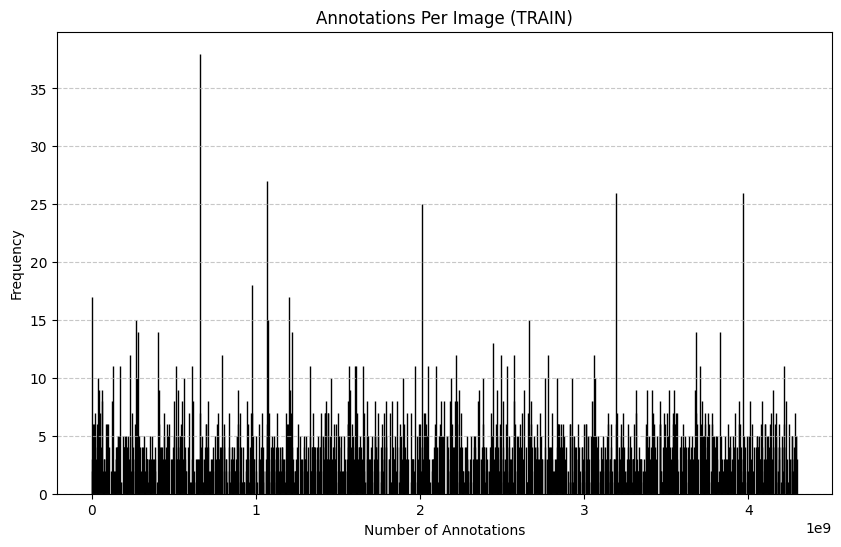

<Figure size 640x480 with 0 Axes>

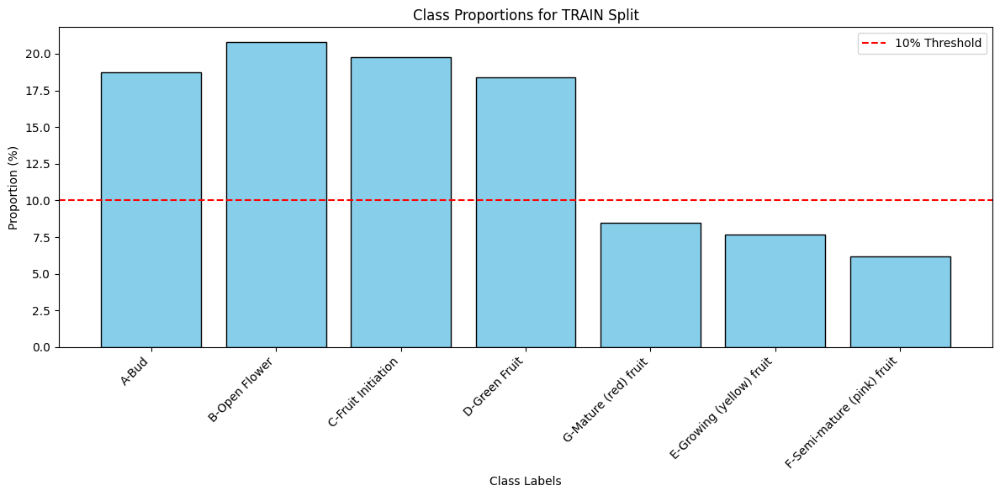


Analyzing TEST split...
Number of annotations in test: 1019
Sample image metadata for test: {'license': 0, 'file_name': 'A (10).JPG', 'coco_url': 'n/a', 'height': 600, 'width': 900, 'date_captured': '', 'flickr_url': 'n/a', 'darwin_url': 'https://darwin.v7labs.com/api/v2/teams/igrow/uploads/d09d520a-64f2-4027-91d9-26f7b3a25b30', 'darwin_workview_url': 'https://darwin.v7labs.com/workview?dataset=734764&item=018e9083-c534-ba5a-7342-f5a679803b65', 'id': 245751905, 'tag_ids': []}
Sample annotation metadata for test: {'id': 2, 'image_id': 245751905, 'category_id': 3554254475, 'segmentation': [[455.0, 335.0, 465.0, 335.0, 466.0, 335.0, 473.0, 338.0, 474.0, 338.0, 475.0, 340.0, 476.0, 341.0, 476.0, 345.0, 476.0, 346.0, 474.0, 350.0, 474.0, 351.0, 466.0, 360.0, 465.0, 361.0, 463.0, 361.0, 462.0, 362.0, 452.0, 355.0, 451.0, 355.0, 448.0, 349.0, 447.0, 348.0, 448.0, 341.0, 448.0, 340.0, 455.0, 335.0]], 'area': 563.5, 'bbox': [447.0, 335.0, 29.0, 27.0], 'iscrowd': 0, 'extra': {}}
Sample category

<Figure size 1000x600 with 0 Axes>

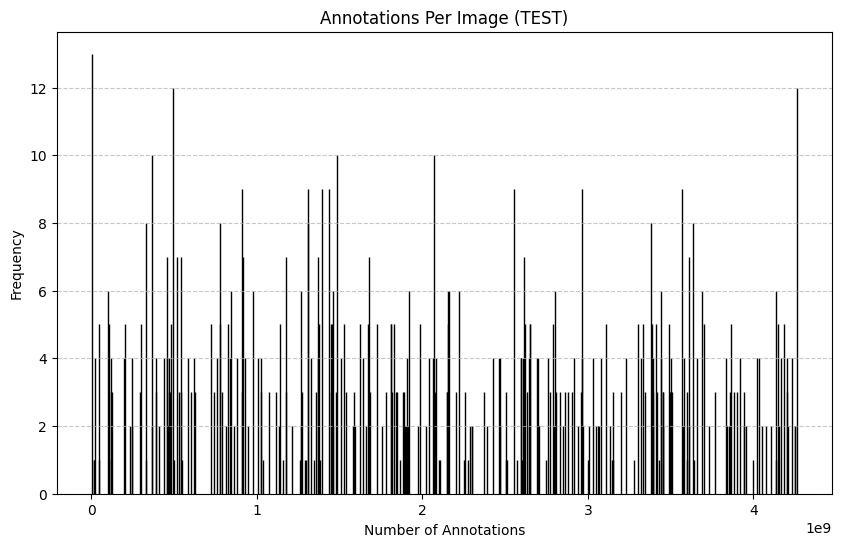

<Figure size 640x480 with 0 Axes>

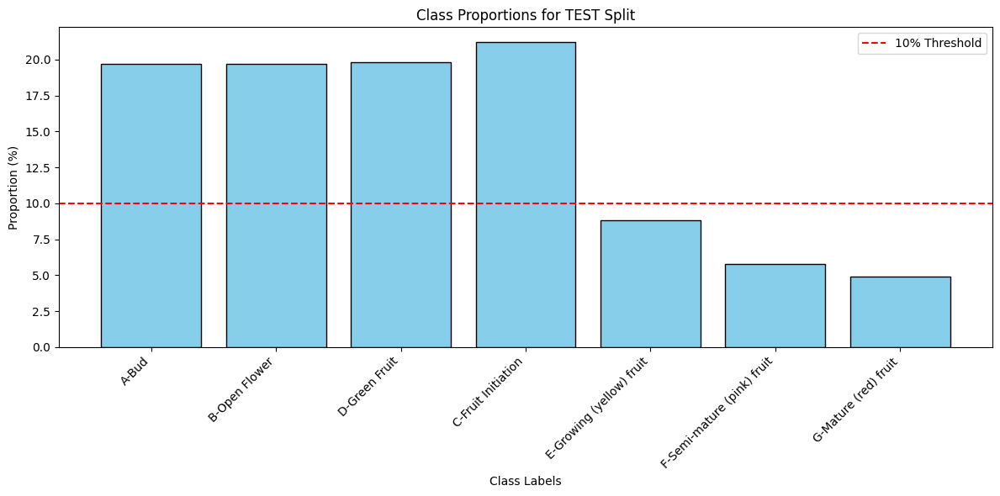


Analyzing VAL split...
Number of annotations in val: 1034
Sample image metadata for val: {'license': 0, 'file_name': 'A (101).JPG', 'coco_url': 'n/a', 'height': 600, 'width': 900, 'date_captured': '', 'flickr_url': 'n/a', 'darwin_url': 'https://darwin.v7labs.com/api/v2/teams/igrow/uploads/26fd292d-c385-4f59-9f7a-c625c9a42788', 'darwin_workview_url': 'https://darwin.v7labs.com/workview?dataset=734764&item=018e9083-c537-2c1d-958e-bcbbe3419967', 'id': 4258418962, 'tag_ids': []}
Sample annotation metadata for val: {'id': 5, 'image_id': 4258418962, 'category_id': 1255198513, 'segmentation': [[437.0, 201.0, 441.0, 202.0, 442.0, 203.0, 453.0, 203.0, 454.0, 203.0, 460.0, 205.0, 461.0, 205.0, 465.0, 211.0, 465.0, 212.0, 474.0, 218.0, 475.0, 219.0, 492.0, 216.0, 493.0, 215.0, 506.0, 216.0, 507.0, 216.0, 507.0, 222.0, 507.0, 223.0, 495.0, 232.0, 494.0, 233.0, 492.0, 240.0, 491.0, 241.0, 491.0, 243.0, 491.0, 244.0, 496.0, 252.0, 496.0, 253.0, 490.0, 255.0, 489.0, 255.0, 478.0, 261.0, 477.0, 261.0

<Figure size 1000x600 with 0 Axes>

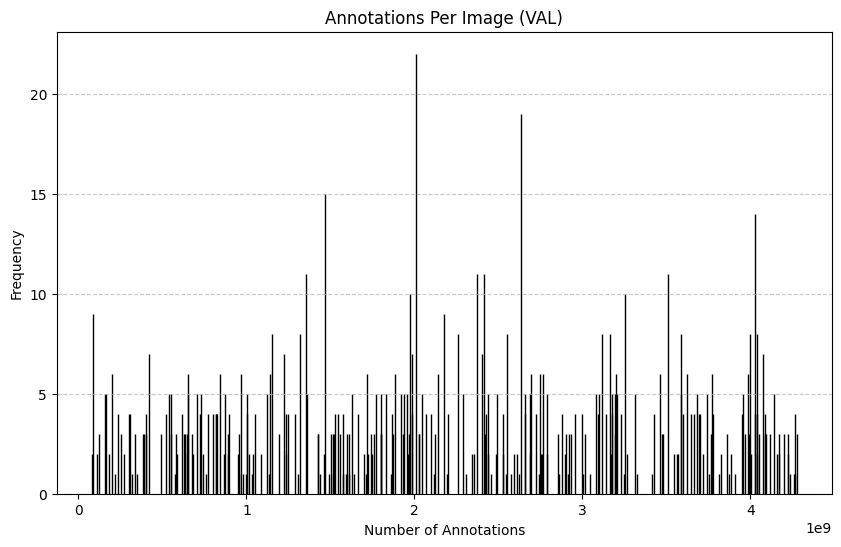

<Figure size 640x480 with 0 Axes>

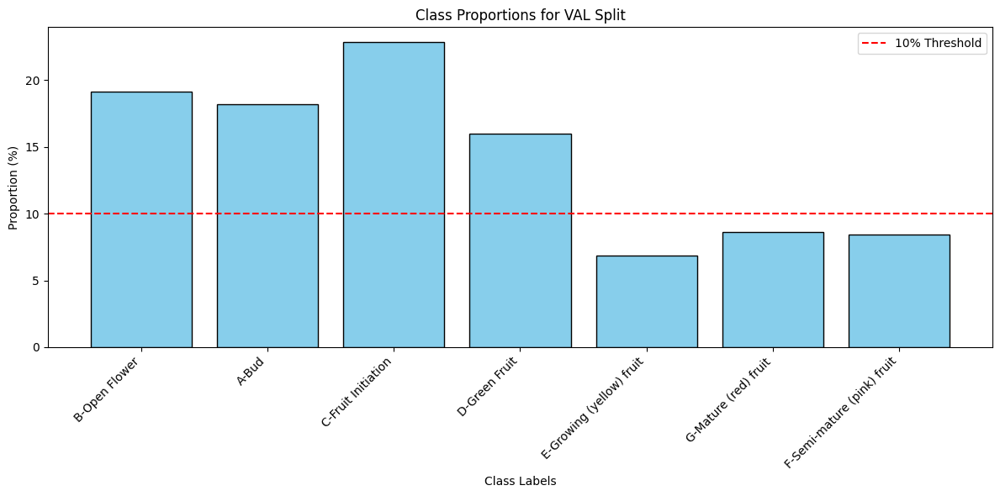

In [ ]:
# ==========================
# Cell: Automated EDA for All Splits (Train → Test → Val)
# ==========================

# Instead of for split_name, split_paths in splits.items():
# we specify the desired order manually:
for split_name in ["train", "test", "val"]:
    split_paths = splits[split_name]

    print(f"\nAnalyzing {split_name.upper()} split...")

    # Load the JSON file once
    with open(split_paths["json"], "r") as f:
        data_dict = json.load(f)

    # Print a quick summary or sample entries
    annotations_count = len(data_dict["annotations"])
    print(f"Number of annotations in {split_name}: {annotations_count}")

    if data_dict["images"]:
        print(f"Sample image metadata for {split_name}:", data_dict["images"][0])
    if data_dict["annotations"]:
        print(f"Sample annotation metadata for {split_name}:", data_dict["annotations"][0])
    if data_dict["categories"]:
        print(f"Sample category metadata for {split_name}:", data_dict["categories"][0])

    # Now perform EDA using the in-memory dictionary
    perform_eda(split_name, data_dict)


### Key Relationships in the Dataset

- **image_id**: Links each annotation to its corresponding image in the `images` key.
- **category_id**: Links each annotation to its category in the `categories` key.
- This structure enables bounding boxes (in `annotations`) to be mapped to specific images and classes.

**Example**: The annotation with `image_id: 4245025475` links to an image in the `images` key and a category in the `categories` key (e.g., "Green Fruit (Stage D)").


## Dataset Inspection

This section inspects the contents of the JSON files across the train, validation, and test splits. It helps verify data consistency, check for the presence of image annotations, and ensure that all necessary metadata (e.g., bounding boxes, segmentation masks, and categories) is present.


In [ ]:
# ==========================
# Cell: Dataset Inspection in Custom Order
# ==========================

def inspect_split(split_name, split_paths):
    print(f"\nInspecting {split_name.upper()} split...")

    # Load the cleaned JSON file
    json_file = split_paths["json"]
    with open(json_file, "r") as f:
        json_annotations = json.load(f)

    # If no images, just note that and return
    if not json_annotations["images"]:
        print("No images found in this split.")
        return

    # Sample the first image
    sample_image_info = json_annotations["images"][0]
    image_name = sample_image_info["file_name"]
    image_id = sample_image_info["id"]

    print(f"Sample image = {image_name}, Image ID: {image_id}")

    # Gather annotations for that image
    json_annotations_for_image = [
        ann for ann in json_annotations["annotations"]
        if ann["image_id"] == image_id
    ]
    print(f"JSON annotations for {image_name}:")
    print(json_annotations_for_image)

# Now call inspect_split in the desired order:
for split_name in ["train", "test", "val"]:
    split_paths = splits[split_name]
    inspect_split(split_name, split_paths)



Inspecting TRAIN split...
Sample image = A (1).JPG, Image ID: 4245025475
JSON annotations for A (1).JPG:
[{'id': 1, 'image_id': 4245025475, 'category_id': 3554254475, 'segmentation': [[427.0, 305.0, 432.0, 305.0, 433.0, 305.0, 436.0, 309.0, 437.0, 310.0, 440.0, 311.0, 441.0, 312.0, 442.0, 327.0, 442.0, 328.0, 440.0, 331.0, 439.0, 332.0, 434.0, 334.0, 433.0, 335.0, 423.0, 336.0, 422.0, 336.0, 420.0, 335.0, 419.0, 335.0, 413.0, 327.0, 413.0, 326.0, 414.0, 321.0, 414.0, 320.0, 420.0, 311.0, 420.0, 310.0, 427.0, 305.0]], 'area': 681.0, 'bbox': [413.0, 305.0, 29.0, 31.0], 'iscrowd': 0, 'extra': {}}]

Inspecting TEST split...
Sample image = A (10).JPG, Image ID: 245751905
JSON annotations for A (10).JPG:
[{'id': 2, 'image_id': 245751905, 'category_id': 3554254475, 'segmentation': [[455.0, 335.0, 465.0, 335.0, 466.0, 335.0, 473.0, 338.0, 474.0, 338.0, 475.0, 340.0, 476.0, 341.0, 476.0, 345.0, 476.0, 346.0, 474.0, 350.0, 474.0, 351.0, 466.0, 360.0, 465.0, 361.0, 463.0, 361.0, 462.0, 362.0, 45

In [ ]:
# ==========================
# Cell: Check Invalid Annotations for All Splits
# ==========================

import json

def find_invalid_annotations(ann_dict):
    """
    Finds invalid annotations with zero-width or zero-height bounding boxes.

    Parameters:
        ann_dict (dict): The in-memory COCO-style annotations dictionary,
                         typically loaded from a cleaned JSON file.
                         Must contain "annotations" key.

    Returns:
        list: A list of invalid annotation dictionaries.
    """
    invalid_annotations = [
        ann
        for ann in ann_dict["annotations"]
        if ann["bbox"][2] == 0 or ann["bbox"][3] == 0
    ]
    print(f"Found {len(invalid_annotations)} invalid annotations.")
    return invalid_annotations


# We specify the desired order explicitly: train, then test, then val
for split_name in ["train", "test", "val"]:
    print(f"\nChecking invalid annotations for {split_name.upper()} split:")

    # 1) Load the cleaned JSON file for this split
    with open(splits[split_name]["json"], "r") as f:
        data_dict = json.load(f)

    # 2) Call find_invalid_annotations
    invalid_anns = find_invalid_annotations(data_dict)

    # 3) Print examples (up to first 3) if any exist
    if invalid_anns:
        print("Examples of invalid annotations:", invalid_anns[:3])
    else:
        print("No invalid annotations found.")



Checking invalid annotations for TRAIN split:
Found 0 invalid annotations.
No invalid annotations found.

Checking invalid annotations for TEST split:
Found 0 invalid annotations.
No invalid annotations found.

Checking invalid annotations for VAL split:
Found 0 invalid annotations.
No invalid annotations found.


### Bounding Box Normalization

This step adjusts bounding box dimensions to account for varying image sizes, ensuring consistent scale across all images.


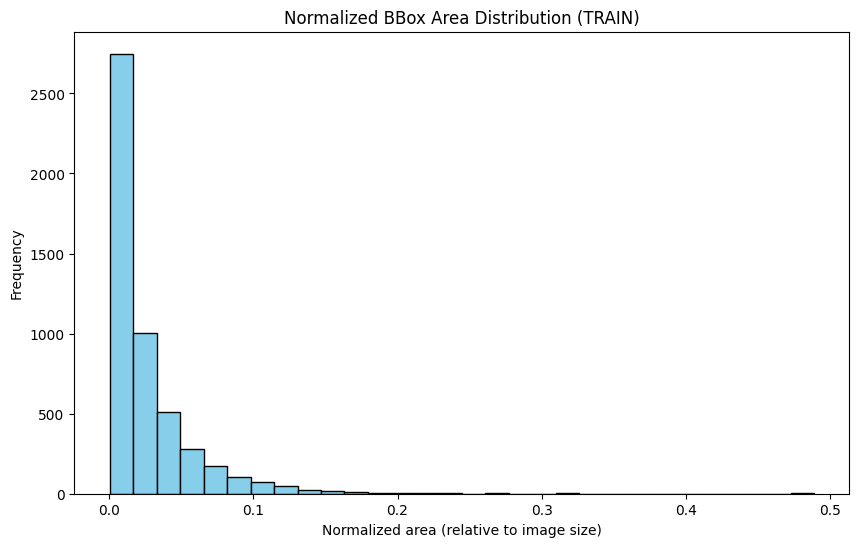

In [ ]:
# ==========================
# Cell: Bounding Box Normalization
# ==========================
import matplotlib.pyplot as plt

def normalize_bbox_sizes_dict(ann_dict):
    """
    Normalizes bounding box sizes (width, height) by the dimensions
    of their corresponding images in a COCO-style annotations dict.

    Parameters:
        ann_dict (dict): A dictionary with "images" and "annotations" keys,
                         loaded from a cleaned JSON file.

    Returns:
        list of (float, float): A list of normalized (width_ratio, height_ratio)
                                for each bounding box.
    """
    if not ann_dict.get("images"):
        raise ValueError("No images found in ann_dict['images']. "
                         "Please load them before calling this function.")

    image_dict = {
        img["id"]: {"width": img["width"], "height": img["height"]}
        for img in ann_dict["images"]
    }

    normalized_sizes = []
    for ann in ann_dict["annotations"]:
        if ann["image_id"] in image_dict:
            w = image_dict[ann["image_id"]]["width"]
            h = image_dict[ann["image_id"]]["height"]
            if w and h:
                width_ratio  = ann["bbox"][2] / w
                height_ratio = ann["bbox"][3] / h
                normalized_sizes.append((width_ratio, height_ratio))

    return normalized_sizes

# 1) Load cleaned JSON dict for TRAIN
with open(splits["train"]["json"], "r") as f:
    train_dict = json.load(f)

# 2) Normalize bounding boxes
train_normalized_sizes = normalize_bbox_sizes_dict(train_dict)

# 3) Plot distribution of normalized area
areas = [w * h for (w, h) in train_normalized_sizes]
plt.figure(figsize=(10, 6))
plt.hist(areas, bins=30, color='skyblue', edgecolor='black')
plt.title("Normalized BBox Area Distribution (TRAIN)")
plt.xlabel("Normalized area (relative to image size)")
plt.ylabel("Frequency")
plt.show()


### Bounding Box Distribution Outlier Check

We analyze the sizes of bounding boxes to identify potential outliers or anomalies.


Total Annotations: 5018
Outlier Annotations Detected: 365
Area Range: min=121.0, max=264114.0
IQR thresholds => lower < -19266.25 or > 40243.75

Showing up to 3 example(s) of outlier bounding boxes...



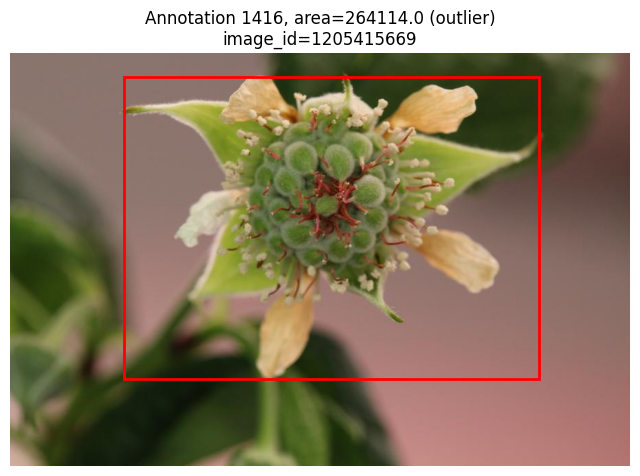

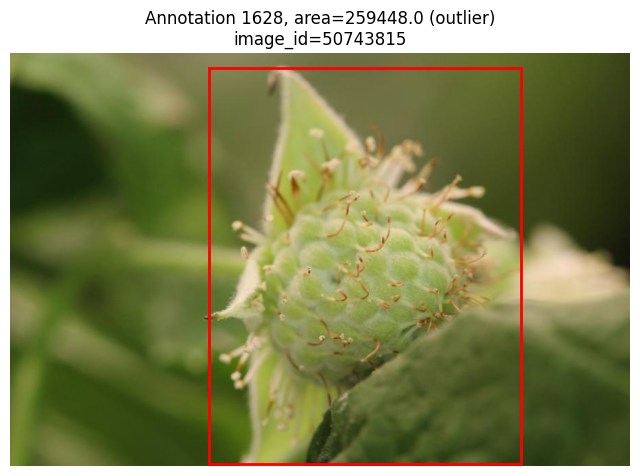

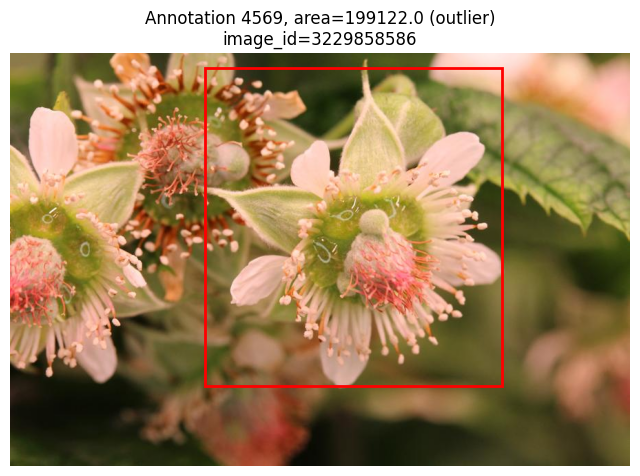

In [ ]:
def detect_and_visualize_outliers(ann_dict, images_dir, iqr_factor=1.5, max_examples=3):
    """
    1) Calculate bounding box areas for all annotations in `ann_dict`.
    2) Identify outliers using an IQR rule (any area < Q1 - iqr_factor*IQR or > Q3 + iqr_factor*IQR).
    3) Print how many outliers found.
    4) Randomly visualize up to `max_examples` outlier bounding boxes in their images.

    Parameters:
      ann_dict (dict): COCO-style annotation dictionary with 'images' and 'annotations'.
      images_dir (str): Path to the folder containing your images.
      iqr_factor (float): The multiplier for the interquartile range. Default 1.5 is a common rule of thumb.
      max_examples (int): How many outlier bounding boxes to visualize at most.
    """
    if "images" not in ann_dict or "annotations" not in ann_dict:
        print("Error: ann_dict must have 'images' and 'annotations'.")
        return

    # 1) Collect bounding box areas
    bboxes = []
    for ann in ann_dict["annotations"]:
        w = ann["bbox"][2]
        h = ann["bbox"][3]
        area = w * h
        bboxes.append((ann["id"], ann["image_id"], area))

    if not bboxes:
        print("No bounding boxes found.")
        return

    # 2) Compute IQR-based outlier thresholds
    areas = np.array([x[2] for x in bboxes])
    Q1 = np.percentile(areas, 25)
    Q3 = np.percentile(areas, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - iqr_factor * IQR
    upper_bound = Q3 + iqr_factor * IQR

    # Identify outliers
    outliers = [(ann_id, img_id, area)
                for (ann_id, img_id, area) in bboxes
                if area < lower_bound or area > upper_bound]

    print(f"Total Annotations: {len(bboxes)}")
    print(f"Outlier Annotations Detected: {len(outliers)}")
    print(f"Area Range: min={areas.min()}, max={areas.max()}")
    print(f"IQR thresholds => lower < {lower_bound:.2f} or > {upper_bound:.2f}\n")

    if not outliers:
        print("No outliers found. Nothing to visualize.")
        return

    # 3) Show some outlier bounding boxes
    # Build a quick index: image_id -> image info
    images_by_id = {img["id"]: img for img in ann_dict["images"]}

    # Sort outliers by area descending (so we see the largest or smallest ones first)
    outliers_sorted = sorted(outliers, key=lambda x: x[2], reverse=True)

    # Decide how many examples to show
    examples_to_show = outliers_sorted[:max_examples]

    print(f"Showing up to {max_examples} example(s) of outlier bounding boxes...\n")

    for (ann_id, image_id, area) in examples_to_show:
        # Gather that annotation
        annotation = next((ann for ann in ann_dict["annotations"] if ann["id"] == ann_id), None)
        if not annotation:
            print(f"Could not find annotation with id={ann_id}")
            continue

        img_info = images_by_id.get(image_id)
        if not img_info:
            print(f"No image found with id={image_id}")
            continue

        img_path = os.path.join(images_dir, img_info["file_name"])

        # Try loading the image
        try:
            img = plt.imread(img_path)
        except Exception as e:
            print(f"Error reading {img_path}:\n{e}")
            continue

        # Plot
        plt.figure(figsize=(8, 6))
        plt.imshow(img)
        x, y, w, h = annotation["bbox"]
        rect = Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
        ax = plt.gca()
        ax.add_patch(rect)

        # Title = annotation ID, area, maybe outlier reason
        plt.title(f"Annotation {ann_id}, area={area:.1f} (outlier)\nimage_id={image_id}")
        plt.axis('off')
        plt.show()

# ====================
# Example usage
# ====================
# Suppose you have something like:
# splits["train"]["json"] -> path to train_cleaned.json
# splits["train"]["images"] -> path to the train images folder
#
# Then you can do:
# -----------------------------------------------------
train_json_path = splits["train"]["json"]
with open(train_json_path, "r") as f:
    train_dict = json.load(f)

detect_and_visualize_outliers(
    ann_dict=train_dict,
    images_dir=splits["train"]["images"],
    iqr_factor=1.5,     # Common factor for outlier detection
    max_examples=3      # Show up to 3 bounding box outliers
)



### Annotation Counts per Image

This section visualizes how many annotations each image contains to check for balance and anomalies.


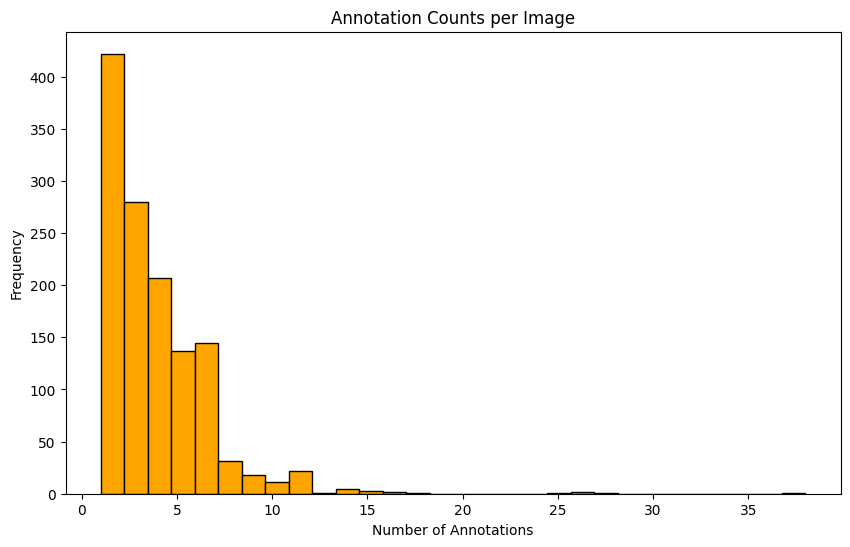

In [ ]:
# ==========================
# Cell: Annotation Counts per Image
# ==========================

def plot_annotation_counts(annotations):
    """
    Plots how many annotations each image contains, to check for balance or anomalies.

    Parameters:
        annotations (dict): A COCO-style dict with an 'annotations' key containing bounding boxes.
    """
    if "annotations" not in annotations:
        print("No 'annotations' key found. Cannot plot annotation counts.")
        return

    image_ids = [ann["image_id"] for ann in annotations["annotations"]]
    counts = Counter(image_ids)

    if not counts:
        print("No annotations found to plot.")
        return

    plt.figure(figsize=(10, 6))
    plt.hist(counts.values(), bins=30, color='orange', edgecolor='black')
    plt.title("Annotation Counts per Image")
    plt.xlabel("Number of Annotations")
    plt.ylabel("Frequency")
    plt.show()

plot_annotation_counts(train_dict)


Total images in annotations: 1290
Annotation Count Outliers Detected: 50
Count Range: min=1, max=38
IQR threshold => above 9.50

Displaying top outlier image_id=656746685 with 38 annotations.

Annotation IDs for image_id=656746685: [1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1104, 1105, 1106, 1107, 1108, 1109, 1110, 1111, 1112, 1113, 1114, 1115, 1116, 2239, 2240, 2241, 2242, 2243, 2244, 2245, 2246, 2247, 2248, 2249, 2250, 2251, 2252, 2253]


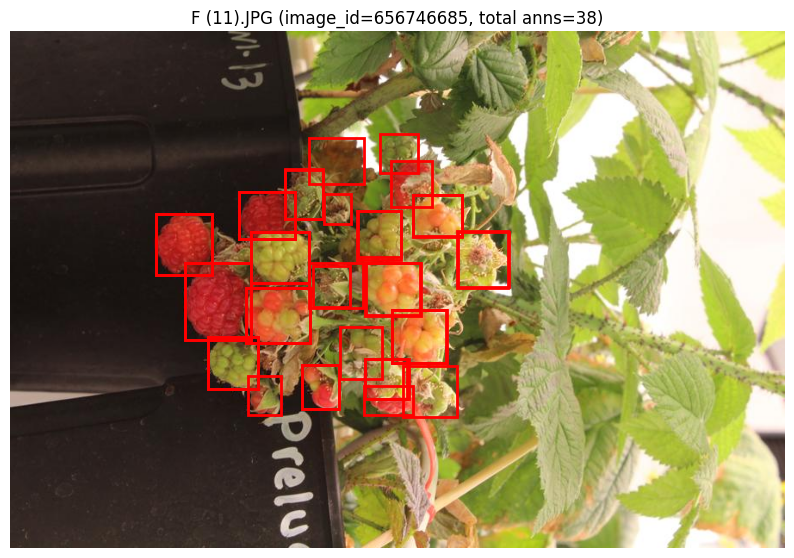

In [ ]:
def detect_and_visualize_count_outlier(
    ann_dict, images_dir, iqr_factor=1.5, show_only_top=True
):
    """
    1) Count how many annotations each image has.
    2) Define outliers by IQR rule: outlier if count > Q3 + iqr_factor*IQR.
    3) If show_only_top=True, pick the single biggest outlier image (the one with the most annotations).
    4) Display that image with bounding boxes and print a summary of its annotation IDs.

    Parameters:
      ann_dict (dict): COCO-style annotation dictionary with 'images' and 'annotations'.
      images_dir (str): Path to the folder containing your images.
      iqr_factor (float): The multiplier for the interquartile range above Q3.
      show_only_top (bool): If True, only show the highest-count outlier image.
                            If False, you could loop over all outliers, etc.
    """
    if "images" not in ann_dict or "annotations" not in ann_dict:
        print("Error: ann_dict must have 'images' and 'annotations'.")
        return

    # 1) Build a count of annotations per image_id
    image_counts = Counter(ann["image_id"] for ann in ann_dict["annotations"])

    # convert to a list of (image_id, count)
    count_list = [(img_id, count) for img_id, count in image_counts.items()]

    # 2) Find outliers by IQR
    counts_only = np.array([c for _, c in count_list])
    Q1 = np.percentile(counts_only, 25)
    Q3 = np.percentile(counts_only, 75)
    IQR = Q3 - Q1
    threshold = Q3 + iqr_factor * IQR

    outliers = [(img_id, c) for (img_id, c) in count_list if c > threshold]

    print(f"Total images in annotations: {len(count_list)}")
    print(f"Annotation Count Outliers Detected: {len(outliers)}")
    print(f"Count Range: min={counts_only.min()}, max={counts_only.max()}")
    print(f"IQR threshold => above {threshold:.2f}\n")

    if not outliers:
        print("No outlier images found. All annotation counts are within the IQR threshold.")
        return

    # pick the single highest outlier image if show_only_top=True
    if show_only_top:
        outliers_sorted = sorted(outliers, key=lambda x: x[1], reverse=True)
        top_outlier_img, top_outlier_count = outliers_sorted[0]

        print(f"Displaying top outlier image_id={top_outlier_img} with {top_outlier_count} annotations.\n")
        visualize_image_with_bboxes(ann_dict, images_dir, top_outlier_img)

    else:
        # Show all outlier images in a loop, if you wanted
        for (img_id, c) in outliers:
            print(f"Outlier image_id={img_id} with {c} annotations.")
            visualize_image_with_bboxes(ann_dict, images_dir, img_id)


def visualize_image_with_bboxes(ann_dict, images_dir, image_id):
    """
    Displays the specified image_id with all bounding boxes overlaid.
    Prints annotation IDs found in that image.
    """
    # build a quick lookup for images
    images_by_id = {img["id"]: img for img in ann_dict["images"]}
    image_info = images_by_id.get(image_id)
    if not image_info:
        print(f"No image found for id={image_id}")
        return

    img_path = os.path.join(images_dir, image_info["file_name"])

    # gather all annotations for this image
    anns_for_image = [ann for ann in ann_dict["annotations"] if ann["image_id"] == image_id]

    if not anns_for_image:
        print(f"No annotations found for image_id={image_id}")
        return

    print(f"Annotation IDs for image_id={image_id}:", [ann["id"] for ann in anns_for_image])

    # load and display
    try:
        img = plt.imread(img_path)
    except Exception as e:
        print(f"Error reading {img_path}:\n{e}")
        return

    plt.figure(figsize=(10, 8))
    plt.imshow(img)
    plt.title(f"{image_info['file_name']} (image_id={image_id}, total anns={len(anns_for_image)})")
    ax = plt.gca()

    # draw bounding boxes
    for ann in anns_for_image:
        x, y, w, h = ann["bbox"]
        rect = Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
    plt.axis("off")
    plt.show()


# ====================
# Example usage
# ====================
# (Adjust to your notebook variables)

train_json_path = splits["train"]["json"]
with open(train_json_path, "r") as f:
    train_dict = json.load(f)

detect_and_visualize_count_outlier(
    ann_dict=train_dict,
    images_dir=splits["train"]["images"],
    iqr_factor=1.5,
    show_only_top=True
)


### Class Distribution with Descriptive Labels

This plot visualizes the class distribution using descriptive labels for each category, improving readability and aligning with other sections of the analysis.


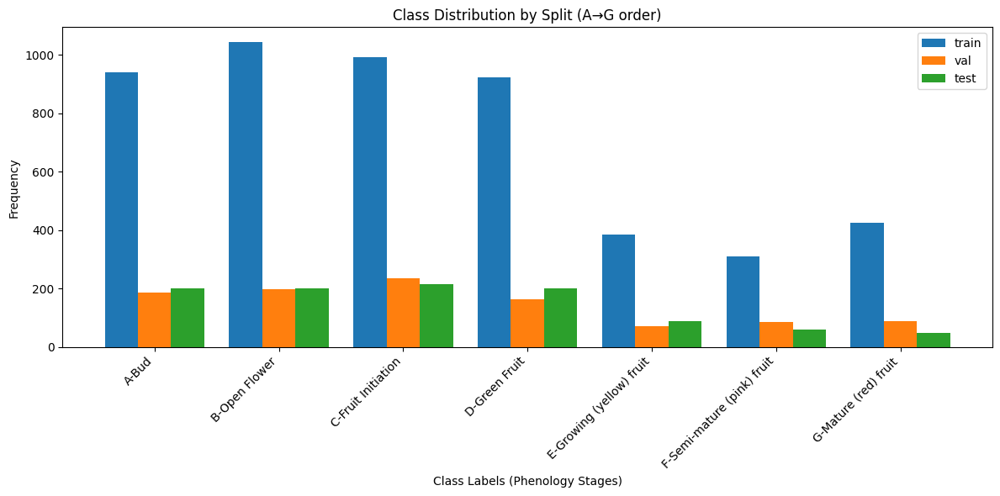

In [ ]:
def plot_class_distribution_by_split(
    data_dicts,
    split_names=("train", "val", "test"),
    class_mapping=None
):
    """
    Creates a single grouped bar chart of class distributions across multiple splits,
    ordering categories by phenology stage (A->B->C->D->E->F->G).
    """

    # -- 1) Build counters of category_ids in each split
    split_counters = {}
    all_category_ids = set()

    for split in split_names:
        ann_dict = data_dicts[split]
        if "annotations" not in ann_dict:
            print(f"No 'annotations' key in {split} data. Skipping.")
            split_counters[split] = Counter()
            continue

        c = Counter(ann["category_id"] for ann in ann_dict["annotations"])
        split_counters[split] = c
        all_category_ids.update(c.keys())

    # -- 2) Define a custom phenology order for A->B->C->D->E->F->G->H
    # You can expand if your dataset actually has "H," or remove it if not needed.
    stage_letter_order = {"A": 0, "B": 1, "C": 2, "D": 3, "E": 4, "F": 5, "G": 6, "H": 7}

    def phenology_sort_key(cid):
        """
        Extract the stage letter (A-G) from your class_mapping (e.g. "A-Bud"),
        then look it up in stage_letter_order.
        If it doesn't match, fallback to a big number so it goes last.
        """
        if class_mapping is not None:
            # example label might be "A-Bud" => letter = "A"
            label = class_mapping.get(cid, "")
            letter = label.split("-")[0].strip()  # take everything before the dash
            return stage_letter_order.get(letter, 999)
        else:
            # If no class_mapping, fallback to numeric sort or do something else
            return cid

    # -- 3) Sort the category IDs by that custom key
    sorted_cats = sorted(all_category_ids, key=phenology_sort_key)

    # -- 4) Prepare data for plotting
    n_splits = len(split_names)
    x_positions = np.arange(len(sorted_cats))
    split_counts = []

    for split in split_names:
        c = split_counters[split]
        # gather the count for each cat in sorted order
        counts_for_split = [c.get(cat_id, 0) for cat_id in sorted_cats]
        split_counts.append(counts_for_split)

    # Build x-axis labels from your mapping or fallback to str(cat_id)
    if class_mapping:
        x_labels = [
            class_mapping.get(cid, f"Unmapped {cid}")
            for cid in sorted_cats
        ]
    else:
        x_labels = [str(cid) for cid in sorted_cats]

    # -- 5) Plot grouped bars
    bar_width = 0.8 / n_splits
    plt.figure(figsize=(12, 6))

    for i, split in enumerate(split_names):
        offset = (i - (n_splits - 1)/2) * bar_width
        positions = x_positions + offset
        plt.bar(positions, split_counts[i], width=bar_width, label=split)

    # -- 6) Final labeling
    plt.title("Class Distribution by Split (A→G order)")
    plt.xlabel("Class Labels (Phenology Stages)")
    plt.ylabel("Frequency")
    plt.xticks(x_positions, x_labels, rotation=45, ha="right")
    plt.legend()
    plt.tight_layout()
    plt.show()

with open(splits["train"]["json"], "r") as f:
    train_dict = json.load(f)
with open(splits["val"]["json"], "r") as f:
    val_dict = json.load(f)
with open(splits["test"]["json"], "r") as f:
    test_dict = json.load(f)

data_dicts = {
    "train": train_dict,
    "val": val_dict,
    "test": test_dict
}

# Call the function with your custom mapping
plot_class_distribution_by_split(
    data_dicts,
    split_names=("train","val","test"),
    class_mapping=class_mapping
)


In [ ]:
# --------------------------
# 1) Define the correct class_mapping
# --------------------------

class_mapping = {
    3554254475: "A-Bud",
    1255198513: "B-Open Flower",
    1037565863: "C-Fruit Initiation",
    2746444292: "D-Green Fruit",
    3568589458: "E-Growing (yellow) fruit",
    1304234792: "F-Semi-mature (pink) fruit",
    985283518:  "G-Mature (red) fruit"
}

# --------------------------
# 2) The show_class_proportions_by_split function
# --------------------------
def show_class_proportions_by_split(data_dicts, split_names=("train", "val", "test"), class_mapping=None):
    """
    Prints a neat table of class proportions for each split, in phenological order (A->G).

    Parameters:
    -----------
    data_dicts : dict
        A dictionary like {"train": train_dict, "val": val_dict, "test": test_dict}
        where each value is a COCO-style annotations dict with "annotations".
    split_names : tuple of str
        The keys in data_dicts to process (default is train/val/test).
    class_mapping : dict, optional
        Maps category_id -> descriptive label (e.g., "A-Bud", "B-Open Flower", etc.).
    """
    # Define a custom order for stages:
    stage_letter_order = {"A": 0, "B": 1, "C": 2, "D": 3, "E": 4, "F": 5, "G": 6, "H": 7}

    def get_stage_sort_key(cat_id):
        """
        Looks at class_mapping (like 'A-Bud') and extracts the first letter ('A'),
        then uses stage_letter_order to sort. If not found, sorts at the end (999).
        """
        if class_mapping is None:
            return cat_id  # fallback to numeric sorting if no class_mapping
        label = class_mapping.get(cat_id, "")
        # e.g. "A-Bud" -> "A"; if no dash, just take the first character
        letter = label.split("-")[0].strip()
        return stage_letter_order.get(letter, 999)

    # For each split, compute and print a table of (cat_id, label, count, proportion)
    for split in split_names:
        if split not in data_dicts:
            print(f"Split '{split}' not found in data_dicts. Skipping.")
            continue

        ann_dict = data_dicts[split]
        if "annotations" not in ann_dict:
            print(f"No 'annotations' key in {split} data. Skipping.")
            continue

        # Count how many annotations for each category
        cat_counter = Counter(ann["category_id"] for ann in ann_dict["annotations"])
        total = sum(cat_counter.values())

        # If no annotations, just skip
        if total == 0:
            print(f"=== {split.upper()} ===")
            print("No annotations found.")
            continue

        # Gather all category_ids found in this split
        cat_ids = list(cat_counter.keys())
        # Sort them by the phenological order
        cat_ids_sorted = sorted(cat_ids, key=get_stage_sort_key)

        print(f"=== {split.upper()} Class Proportions (A->G order) ===")
        print(f"{'ID':>10} | {'Label':<30} | {'Count':>5} | {'Proportion':>10}")
        print("-" * 65)

        for cid in cat_ids_sorted:
            count = cat_counter[cid]
            proportion = count / total
            # Build a descriptive label
            # If the ID isn't in class_mapping, it will say "Unmapped {cid}"
            label = class_mapping.get(cid, f"Unmapped {cid}")

            print(f"{cid:>10} | {label:<30} | {count:>5} | {proportion:>9.2%}")

        print()  # blank line after each split


# -----------------------------
# 3) Load data & call the function
# -----------------------------
with open(splits["train"]["json"], "r") as f:
    train_dict = json.load(f)
with open(splits["val"]["json"], "r") as f:
    val_dict = json.load(f)
with open(splits["test"]["json"], "r") as f:
    test_dict = json.load(f)

data_dicts = {
    "train": train_dict,
    "val": val_dict,
    "test": test_dict
}

show_class_proportions_by_split(data_dicts, ("train","val","test"), class_mapping=class_mapping)


=== TRAIN Class Proportions (A->G order) ===
        ID | Label                          | Count | Proportion
-----------------------------------------------------------------
3554254475 | A-Bud                          |   939 |    18.71%
1255198513 | B-Open Flower                  |  1042 |    20.77%
1037565863 | C-Fruit Initiation             |   993 |    19.79%
2746444292 | D-Green Fruit                  |   924 |    18.41%
3568589458 | E-Growing (yellow) fruit       |   386 |     7.69%
1304234792 | F-Semi-mature (pink) fruit     |   309 |     6.16%
 985283518 | G-Mature (red) fruit           |   425 |     8.47%

=== VAL Class Proportions (A->G order) ===
        ID | Label                          | Count | Proportion
-----------------------------------------------------------------
3554254475 | A-Bud                          |   188 |    18.18%
1255198513 | B-Open Flower                  |   198 |    19.15%
1037565863 | C-Fruit Initiation             |   236 |    22.82%
274644429

## Visualizations

This section includes visualizations of bounding boxes and annotations for individual images.



=== 'A'-prefixed Image Files ===


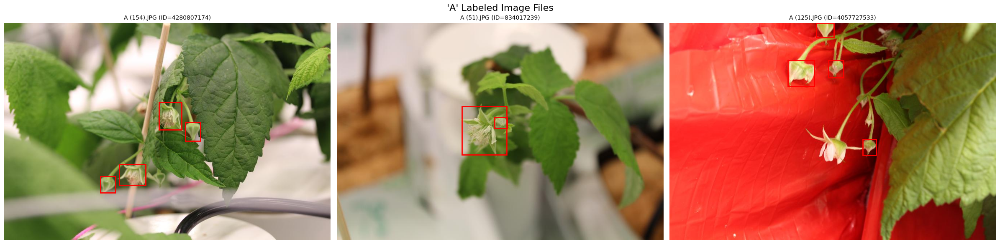


=== 'B'-prefixed Image Files ===


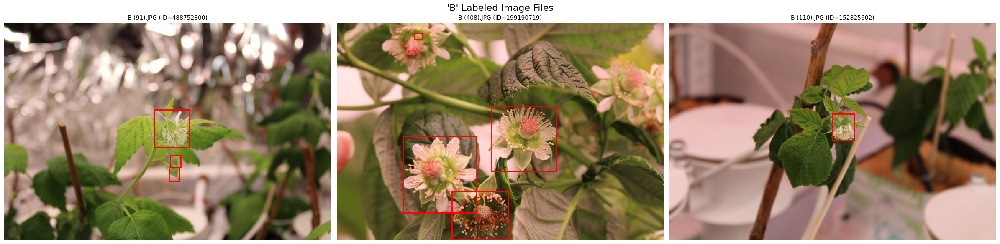


=== 'C'-prefixed Image Files ===


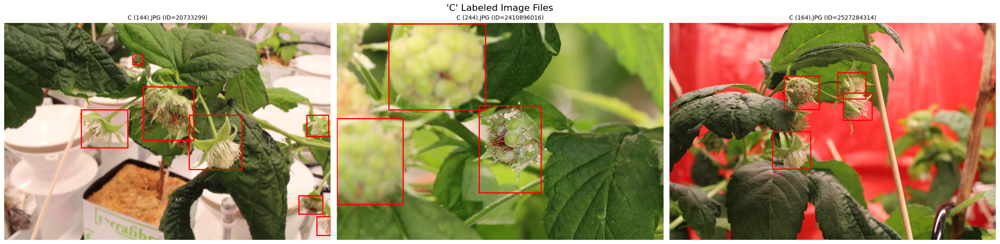


=== 'D'-prefixed Image Files ===


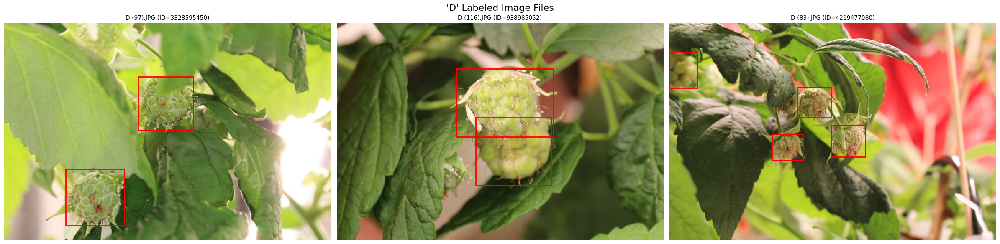


=== 'E'-prefixed Image Files ===


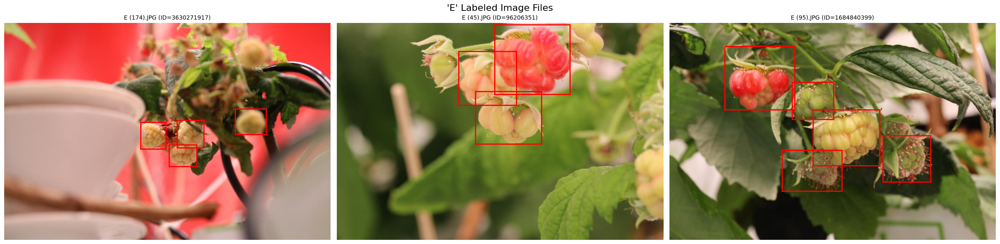


=== 'F'-prefixed Image Files ===


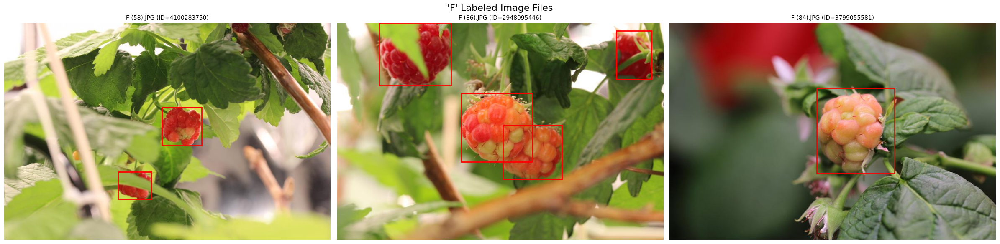


=== 'G'-prefixed Image Files ===


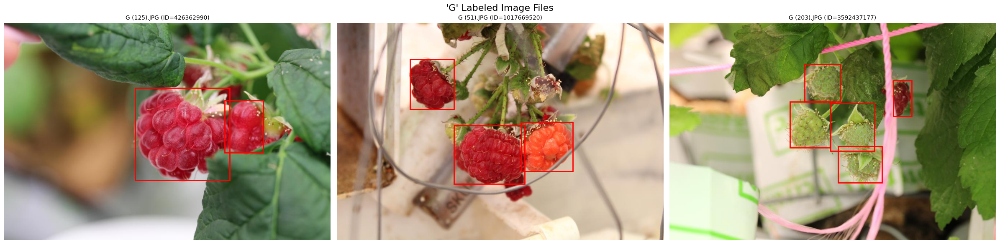

In [ ]:
def visualize_random_images_by_filename_prefix(
    ann_dict,
    images_dir,
    letters=("A","B","C","D","E","F","G"),
    images_per_letter=3,
    seed=42
):
    """
    For each letter in `letters`, randomly pick up to `images_per_letter`
    images whose file_name starts with that letter. Then display bounding boxes
    for *all* annotations in those images.

    Parameters:
    -----------
    ann_dict : dict
        COCO-style annotation dictionary, containing "images" and "annotations".
    images_dir : str
        Path to the folder with image files.
    letters : tuple of str
        Which leading letters to look for, e.g. ("A","B","C","D","E","F","G").
    images_per_letter : int
        How many images to randomly sample for each letter.
    seed : int
        For reproducible random selection.
    """
    random.seed(seed)

    # 1) Group image_ids by the first letter of the file_name
    letter_to_image_ids = defaultdict(list)

    # Build a quick {id -> image_info} map for convenience
    images_by_id = {img["id"]: img for img in ann_dict["images"]}

    for img_info in ann_dict["images"]:
        fname = img_info["file_name"]
        # If the file starts with an uppercase letter in "A-G", or
        # you can handle .upper() etc. depending on your naming style
        if len(fname) > 0:
            first_char = fname[0].upper()  # Convert to uppercase
            if first_char in letters:
                letter_to_image_ids[first_char].append(img_info["id"])

    # 2) For each letter, pick up to images_per_letter random images
    for letter in letters:
        image_ids_for_letter = letter_to_image_ids[letter]
        if not image_ids_for_letter:
            print(f"\nNo images found starting with '{letter}'.")
            continue

        random.shuffle(image_ids_for_letter)
        chosen_ids = image_ids_for_letter[:images_per_letter]

        print(f"\n=== '{letter}'-prefixed Image Files ===")
        show_multiple_images_with_bboxes(
            ann_dict=ann_dict,
            images_dir=images_dir,
            image_ids=chosen_ids,
            title=f"'{letter}' Labeled Image Files"
        )

def show_multiple_images_with_bboxes(
    ann_dict,
    images_dir,
    image_ids,
    title=""
):
    """
    Displays a row of images, each with *all* bounding boxes from ann_dict,
    ignoring category_id (so you see *all* annotations).
    """
    # Build {id: info} dict
    images_by_id = {img["id"]: img for img in ann_dict["images"]}

    fig, axes = plt.subplots(1, len(image_ids), figsize=(8*len(image_ids), 6))
    if len(image_ids) == 1:
        axes = [axes]  # handle single-subplot case

    if title:
        fig.suptitle(title, fontsize=16)

    for ax, image_id in zip(axes, image_ids):
        img_info = images_by_id.get(image_id)
        if not img_info:
            ax.set_title(f"Missing image_id={image_id}")
            ax.axis('off')
            continue

        img_path = os.path.join(images_dir, img_info["file_name"])
        try:
            img = plt.imread(img_path)
        except Exception as e:
            ax.set_title(f"Error reading {img_path}:\n{e}")
            ax.axis('off')
            continue

        ax.imshow(img)
        ax.set_title(f"{img_info['file_name']} (ID={image_id})", fontsize=10)
        ax.axis('off')

        # Gather *all* annotations for this image
        anns_for_image = [
            ann for ann in ann_dict["annotations"]
            if ann["image_id"] == image_id
        ]

        # Draw bounding boxes (all categories)
        for ann in anns_for_image:
            x, y, w, h = ann["bbox"]
            rect = Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)

    plt.tight_layout()
    plt.show()

visualize_random_images_by_filename_prefix(
    ann_dict=train_dict,
    images_dir=splits["train"]["images"],
    letters=("A","B","C","D","E","F","G"),
    images_per_letter=3,
    seed=123
)


## Summary of EDA Insights

### Dataset Integrity and Cleaning
- **File Discrepancies:**  
  - The original JSON annotations listed more images than were actually present in the train and validation directories (with several missing and extra files identified).  
  - A cleaning process was applied to remove JSON entries for missing images and ignore extra files, resulting in new cleaned JSON files (`train_cleaned.json`, `val_cleaned.json`, and `test_cleaned.json`).
- **Consistency:**  
  - The test set was already consistent, and after cleaning, all splits now have reliable image–annotation pairings for further analysis and modeling.

### Class Distribution and Imbalance
- **Defined Classes:**  
  - There are seven phenological classes corresponding to the growth stages:
    - **A:** Bud  
    - **B:** Open Flower  
    - **C:** Fruit Initiation  
    - **D:** Green Fruit  
    - **E:** Growing (yellow) fruit  
    - **F:** Semi-mature (pink) fruit  
    - **G:** Mature (red) fruit
- **Annotation Counts (Training Split):**  
  - **A-Bud:** ~939 annotations (≈18.7%)  
  - **B-Open Flower:** ~1042 annotations (≈20.8%)  
  - **C-Fruit Initiation:** ~993 annotations (≈19.8%)  
  - **D-Green Fruit:** ~924 annotations (≈18.4%)  
  - **E-Growing (yellow) fruit:** ~386 annotations (≈7.7%)  
  - **F-Semi-mature (pink) fruit:** ~309 annotations (≈6.2%)  
  - **G-Mature (red) fruit:** ~425 annotations (≈8.5%)
- **Imbalance Consideration:**  
  - Classes E, F, and G are noticeably underrepresented compared to the other classes. This pattern is consistent across the validation and test splits and may require strategies such as data augmentation or class weighting during model training.

### Bounding Box Analysis
- **Normalized Areas:**  
  - In the training set, normalized bounding box areas (computed as the bounding box area divided by the image area) have a **mean** of ~0.0257 and a **median** of ~0.0140, indicating that the objects (raspberries) occupy only a small fraction of the image.
  - All normalized areas fall within the expected range [0, 1].
- **Outlier Detection:**  
  - An IQR-based analysis identified a subset of bounding boxes with unusually small or large areas. While most annotations fall within a typical size range, a few outliers (with exceptionally high or low areas) suggest possible annotation errors or atypical instances that merit further inspection.
- **Annotation Density:**  
  - Most images contain between 1 and 9 annotations; however, a few images show a significantly higher number of annotations (up to 38), indicating the need for additional quality checks.

### Visualization Insights
- **Histogram Insights:**  
  - Histograms of normalized bounding box areas reveal a skewed distribution, with most boxes being relatively small compared to the overall image size.
- **Grouped Bar Charts:**  
  - Grouped bar charts of class distributions across the train, validation, and test splits confirm the overall consistency of the class proportions and highlight the underrepresentation of classes E, F, and G.
- **Qualitative Assessment:**  
  - Visualizations of sampled images with overlaid bounding boxes validate that most annotations align with expected phenological stages. However, a direct comparison between image content and JSON labels revealed occasional labeling errors by the dataset creators. Although these errors are not quantified, they are important to note as they could affect model performance if not accounted for during training.

### Overall Considerations
- **Data Quality:**  
  - The comprehensive cleaning and inspection steps have ensured that the dataset is consistent and generally of high quality for further processing.
- **Labeling Errors:**  
  - A visual review of sampled images against the corresponding JSON annotations identified some labeling errors. While these inconsistencies do not appear to be widespread or fatal to the dataset’s utility, they should be taken into account during model development and evaluation.
- **Future Steps:**  
  - The class imbalances and bounding box outliers, along with the observed labeling errors, are key considerations for model training. Future work may include implementing data augmentation, refining normalization techniques, or even manually reviewing critical annotations to mitigate potential impacts on model performance.

